In [70]:
%pip install -Uq diffusers transformers fastcore

Note: you may need to restart the kernel to use updated packages.


In [71]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

In [72]:
# pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",
#                                                variant="fp16", torch_dtype=torch.float16).to("cuda")

In [73]:
!ls ~/.cache/huggingface/hub

models--CompVis--stable-diffusion-v1-4
models--google--gemma-7b-it
models--openai--clip-vit-large-patch14
models--runwayml--stable-diffusion-v1-5
models--sentence-transformers--all-mpnet-base-v2
models--stabilityai--sd-vae-ft-ema
version_diffusers_cache.txt
version.txt


In [74]:
# prompt = "a photograph of an astronaut riding a horse"

In [75]:
# pipe(prompt).images[0]

In [76]:
# torch.manual_seed(seed=1024)
# pipe(prompt).images[0]

In [77]:
# torch.manual_seed(1024)
# pipe(prompt, num_inference_steps=3).images[0]

### Classifier-Free Guidance

In [78]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [79]:
# num_rows,num_cols = 4,4
# prompts = [prompt] * num_cols

In [80]:
# prompts

In [81]:
# images = concat(pipe(prompts, guidance_scale=g).images for g in [1.1,3,7,14])

In [82]:
# image_grid(images, rows=num_rows, cols=num_cols)

### Negative prompts

In [83]:
# torch.manual_seed(1000)
# prompt = "Labrador in the style of Vermeer"
# pipe(prompt).images[0]

In [84]:
# torch.manual_seed(1000)
# pipe(prompt, negative_prompt="blue").images[0]


### Image to Image

In [85]:
import logging
from pathlib import Path

import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image

logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.cache/huggingface'/'token').exists(): notebook_login()

from diffusers import StableDiffusionImg2ImgPipeline
%pip install fastdownload 
from fastdownload import FastDownload

Note: you may need to restart the kernel to use updated packages.


In [86]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    variant="fp16",
    torch_dtype=torch.float16,
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

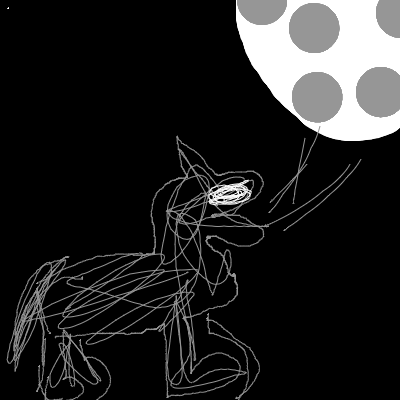

In [87]:
p = FastDownload().download('https://cdn-uploads.huggingface.co/production/uploads/1664665907257-noauth.png')
init_image = Image.open(p).convert("RGB")
init_image

/home/joseph/miniconda3/envs/clip/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:767: FutureWarning: You have passed 10 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/70 [00:00<?, ?it/s]

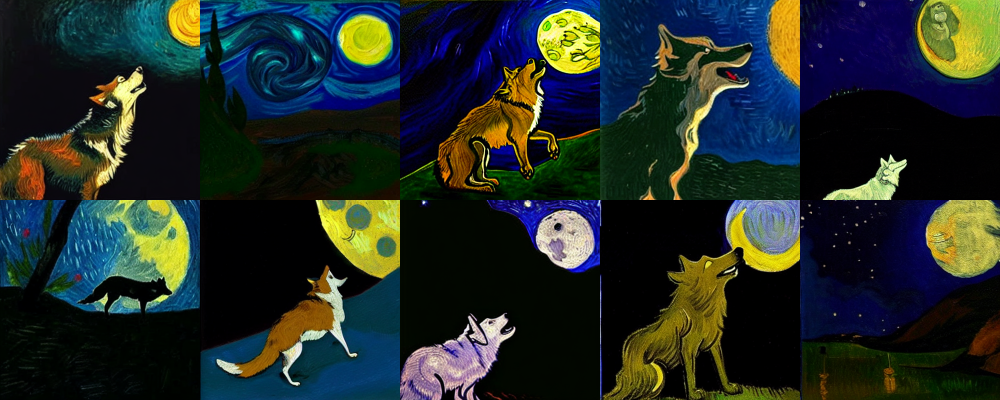

In [88]:
torch.manual_seed(1000)
prompt = "Oil painting of wolf howling at the moon by Van Gogh"
images = pipe(prompt=prompt, num_images_per_prompt=10, image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=2, cols=5)















































































### Fine-tuning

In [89]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", variant="fp16", torch_dtype=torch.float16) 
pipe = pipe.to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [90]:
embeds_url = "https://huggingface.co/sd-concepts-library/indian-watercolor-portraits/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)
embeds_dict = torch.load(str(embeds_path), map_location="cpu")


### Stable Diffusion Structure

1. Autoencoder (VAE)
2. U-Net
3. Text-Encoder (CLIP's Text Encode)

Schedulers
- PNDM (default)
- DDIM
- K-LMS

/home/joseph/miniconda3/envs/clip/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:875: FutureWarning: `callback` is deprecated and will be removed in version 1.0.0. Passing `callback` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`
  deprecate(
/home/joseph/miniconda3/envs/clip/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:881: FutureWarning: `callback_steps` is deprecated and will be removed in version 1.0.0. Passing `callback_steps` as an input argument to `__call__` is deprecated, consider using `callback_on_step_end`
  deprecate(


  0%|          | 0/50 [00:00<?, ?it/s]

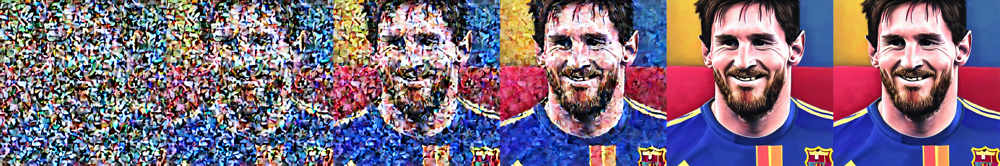

In [91]:
vae = pipe.vae
images = []

def latents_callback(i, t, latents):
    latents = 1/0.18215*latents
    image = vae.decode(latents).sample[0]
    image = (image / 2+0.5).clamp(0,1)
    image = image.cpu().permute(1,2,0).numpy()
    images.extend(pipe.numpy_to_pil(image))
    
prompt = "Portrait painting of football star messi looking happy"
torch.manual_seed(9000)
final_image = pipe(prompt,callback=latents_callback, callback_steps=10).images[0]
images.append(final_image)
image_grid(images, rows=1, cols=len(images))

In [92]:
from transformers import CLIPTextModel, CLIPTokenizer

tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to("cuda")

In [93]:
from diffusers import AutoencoderKL, UNet2DConditionModel

In [94]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema", torch_dtype=torch.float16).to("cuda")
unet = UNet2DConditionModel.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="unet", torch_dtype=torch.float16).to("cuda")

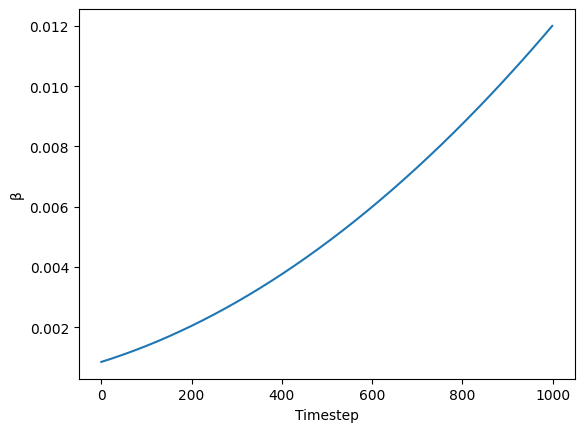

In [95]:
beta_start, beta_end = 0.00085, 0.012
plt.plot(torch.linspace(beta_start**0.5, beta_end**0.5, 1000)**2)
plt.xlabel('Timestep')
plt.ylabel('β');

In [96]:
from diffusers import LMSDiscreteScheduler

scheduler = LMSDiscreteScheduler(beta_start=beta_start, beta_end=beta_end, beta_schedule="scaled_linear", num_train_timesteps=1000)

In [97]:
prompt = ["a photograph of an astronaut riding a horse"]

height = 512
width = 512
num_inference_steps = 70
guidance_scale = 7.5
batch_size = 1

In [98]:
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_input['input_ids']

tensor([[49406,   320,  8853,   539,   550, 18376,  6765,   320,  4558, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]])

In [99]:
tokenizer.decode(49407)

'<|endoftext|>'

In [100]:
text_input['attention_mask']

tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])

In [101]:
text_embeddings = text_encoder(text_input.input_ids.to("cuda"))[0].half()
text_embeddings.shape

torch.Size([1, 77, 768])

In [102]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer(
    [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
)
uncond_embeddings = text_encoder(uncond_input.input_ids.to("cuda"))[0].half()
uncond_embeddings.shape

torch.Size([1, 77, 768])

In [103]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

In [104]:
torch.manual_seed(100)
latents = torch.randn((batch_size, unet.in_channels, height // 8, width // 8))
latents = latents.to("cuda").half()
latents.shape

/tmp/ipykernel_3834/3204366318.py:2: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((batch_size, unet.in_channels, height // 8, width // 8))


torch.Size([1, 4, 64, 64])

In [105]:
scheduler.set_timesteps(num_inference_steps)
latents = latents*scheduler.init_noise_sigma

In [106]:
scheduler.timesteps

tensor([999.0000, 984.5217, 970.0435, 955.5652, 941.0870, 926.6087, 912.1304,
        897.6522, 883.1739, 868.6957, 854.2174, 839.7391, 825.2609, 810.7826,
        796.3043, 781.8261, 767.3478, 752.8696, 738.3913, 723.9130, 709.4348,
        694.9565, 680.4783, 666.0000, 651.5217, 637.0435, 622.5652, 608.0870,
        593.6087, 579.1304, 564.6522, 550.1739, 535.6957, 521.2174, 506.7391,
        492.2609, 477.7826, 463.3044, 448.8261, 434.3478, 419.8696, 405.3913,
        390.9131, 376.4348, 361.9565, 347.4783, 333.0000, 318.5217, 304.0435,
        289.5652, 275.0869, 260.6087, 246.1304, 231.6522, 217.1739, 202.6956,
        188.2174, 173.7391, 159.2609, 144.7826, 130.3044, 115.8261, 101.3478,
         86.8696,  72.3913,  57.9130,  43.4348,  28.9565,  14.4783,   0.0000])

In [107]:
scheduler.sigmas

tensor([14.6146, 13.3974, 12.3033, 11.3184, 10.4301,  9.6279,  8.9020,  8.2443,
         7.6472,  7.1044,  6.6102,  6.1594,  5.7477,  5.3709,  5.0258,  4.7090,
         4.4178,  4.1497,  3.9026,  3.6744,  3.4634,  3.2680,  3.0867,  2.9183,
         2.7616,  2.6157,  2.4794,  2.3521,  2.2330,  2.1213,  2.0165,  1.9180,
         1.8252,  1.7378,  1.6552,  1.5771,  1.5031,  1.4330,  1.3664,  1.3030,
         1.2427,  1.1852,  1.1302,  1.0776,  1.0272,  0.9788,  0.9324,  0.8876,
         0.8445,  0.8029,  0.7626,  0.7236,  0.6858,  0.6490,  0.6131,  0.5781,
         0.5438,  0.5102,  0.4770,  0.4443,  0.4118,  0.3795,  0.3470,  0.3141,
         0.2805,  0.2455,  0.2084,  0.1672,  0.1174,  0.0292,  0.0000])

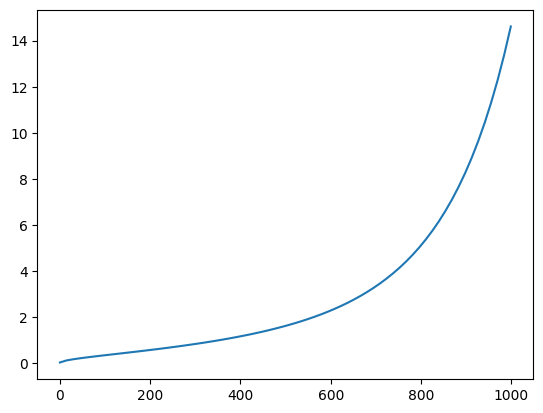

In [108]:
plt.plot(scheduler.timesteps, scheduler.sigmas[:-1]);

In [109]:
from tqdm.auto import tqdm

for i, t in enumerate(tqdm(scheduler.timesteps)):
    input = torch.cat([latents]*2)
    input = scheduler.scale_model_input(input, t)
    
    # predict noise residual
    with torch.no_grad():
        pred = unet(input, t, encoder_hidden_states=text_embeddings).sample
    
    # perform guidance
    pred_uncond, pred_text = pred.chunk(2)
    pred = pred_uncond + guidance_scale*(pred_text - pred_uncond)
    
    # compute "previous" noisy sample
    latents = scheduler.step(pred, t, latents).prev_sample


  0%|          | 0/70 [00:00<?, ?it/s]

In [110]:
with torch.no_grad():
    image = vae.decode(1/0.18215*latents).sample

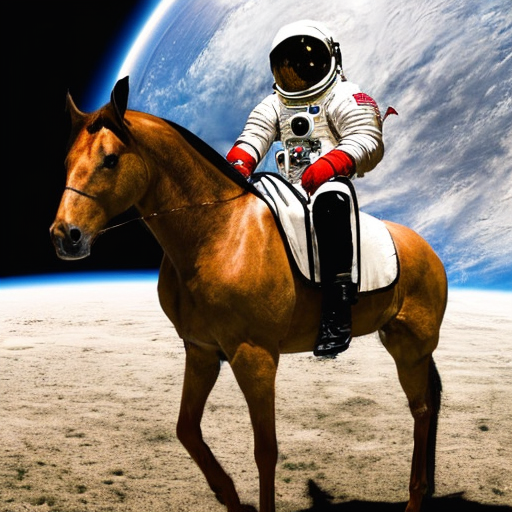

In [111]:
image = (image/2+0.5).clamp(0,1)
image = image[0].detach().cpu().permute(1,2,0).numpy()
image = (image*255).round().astype("uint8")
Image.fromarray(image)

/tmp/ipykernel_3834/2549259506.py:16: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((len(prompts), unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

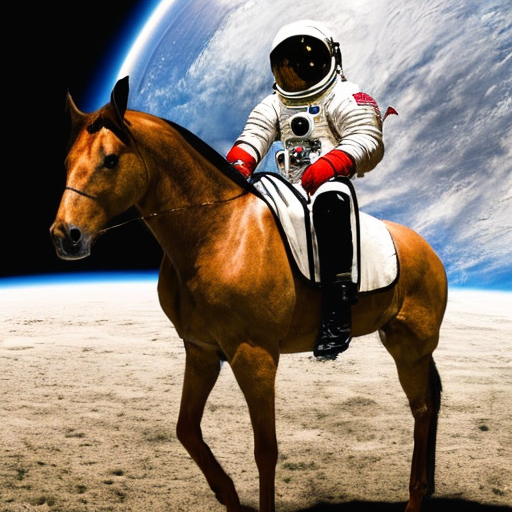

In [112]:
prompts = [
    'a photograph of an astronaut riding a horse',
    'an oil painting of an astronaut riding a horse in the style of grant wood'
]
text_input = tokenizer(prompts, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_embeddings = text_encoder(text_input.input_ids.to("cuda"))[0].half()

max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * len(prompts), padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to("cuda"))[0].half()
emb = torch.cat([uncond_embeddings, text_embeddings])

torch.manual_seed(100)
g = guidance_scale

latents = torch.randn((len(prompts), unet.in_channels, height//8, width//8))
scheduler.set_timesteps(num_inference_steps)
latents = latents.to("cuda").half() * scheduler.init_noise_sigma

for i,ts in enumerate(tqdm(scheduler.timesteps)):
    inp = scheduler.scale_model_input(torch.cat([latents] * 2), ts)
    with torch.no_grad(): u,t = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
    pred = u + g*(t-u)
    latents = scheduler.step(pred, ts, latents).prev_sample
    
with torch.no_grad(): image = vae.decode(1 / 0.18215 * latents).sample
res = (image / 2 + 0.5).clamp(0, 1)    

image = res[0].detach().cpu().permute(1, 2, 0).numpy()
image = (image * 255).round().astype("uint8")
Image.fromarray(image)

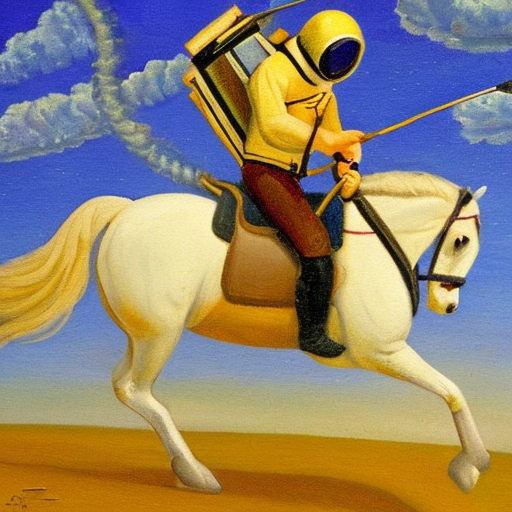

In [113]:
image = res[1].detach().cpu().permute(1, 2, 0).numpy()
image = (image * 255).round().astype("uint8")
Image.fromarray(image)

### Functionize

In [114]:
def text_enc(prompts, maxlen=None):
    if maxlen is None: maxlen = tokenizer.model_max_length
    inp = tokenizer(prompts, padding="max_length", max_length=maxlen, truncation=True, return_tensors="pt")
    return text_encoder(inp.input_ids.to("cuda"))[0].half()

def mk_img(t):
    image = (t/2+0.5).clamp(0,1).detach().cpu().permute(1, 2, 0).numpy()
    return Image.fromarray((image*255).round().astype("uint8"))

In [115]:
def mk_samples(prompts, g=7.5, seed=100, steps=70):
    bs = len(prompts)
    text = text_enc(prompts)
    uncond = text_enc([""]*bs, text.shape[1])
    emb = torch.cat([uncond,text])
    if seed: torch.manual_seed(seed)
    
    latents = torch.randn((bs, unet.in_channels, height//8, width//8))
    scheduler.set_timesteps(steps)
    latents = latents.to("cuda").half() * scheduler.init_noise_sigma
    
    for i, ts in enumerate(tqdm(scheduler.timesteps)):
        inp = scheduler.scale_model_input(torch.cat([latents]*2), ts)
        with torch.no_grad():
            u, t = unet(inp, ts, encoder_hidden_states=emb).sample.chunk(2)
            pred = u + g*(t-u)
            latents = scheduler.step(pred, ts, latents).prev_sample
    with torch.no_grad():
        return vae.decode(1/0.18215*latents).sample
        
        

In [116]:
images = mk_samples(prompts)

/tmp/ipykernel_3834/2569448243.py:8: FutureWarning: Accessing config attribute `in_channels` directly via 'UNet2DConditionModel' object attribute is deprecated. Please access 'in_channels' over 'UNet2DConditionModel's config object instead, e.g. 'unet.config.in_channels'.
  latents = torch.randn((bs, unet.in_channels, height//8, width//8))


  0%|          | 0/70 [00:00<?, ?it/s]

In [118]:
from IPython.display import display

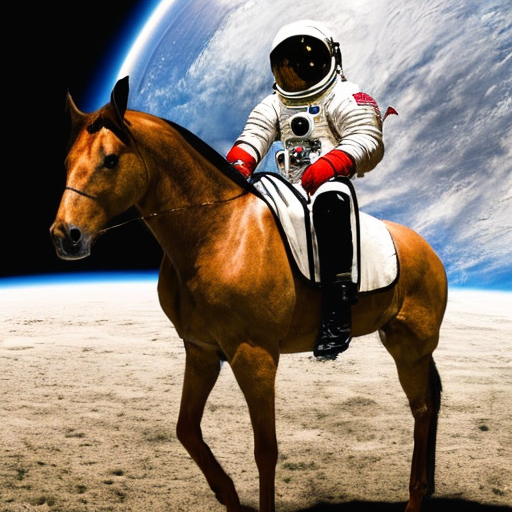

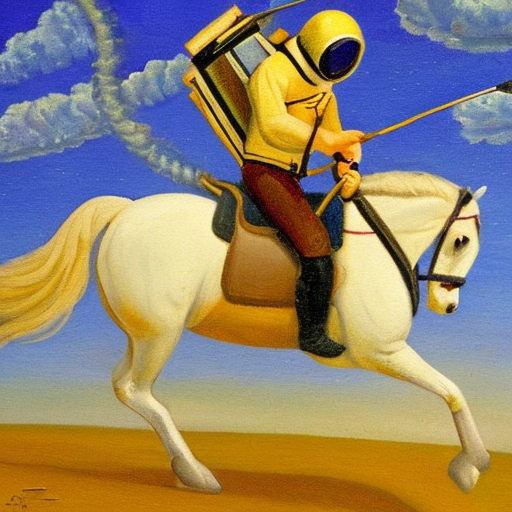

In [119]:
for img in images: display(mk_img(img))